# Proyecto 04

##### Novedades respecto a Proyecto 02


1) Exploración de Datos. Probamos una nueva librería (Pandas Profiling) que simplifica el análisis exploratorio de datos.


2) Preprocesamiento. Mejoramos las tareas de preprocesamiento. Realizando reescalado de datos para todas las variables numéricas y one-hot encoding para dos variables categóricas que a-priori parecían tener una relación importante con el precio ("barrio") y ("tipo de propiedad")


3) Completamos valores faltantes en latitud y longitud con la media calculada por Barrio.


4) Simplificamos la eliminación de outliers con una función y experimentamos con tuberías en Pandas.


5) En los modelos de Machine Learning corrobarmos que los conjuntos de train y test tengan una distribución similar.


6) Incorporamos técnicas de clustering (aprendizaje no supervisado)

## Consigna

En este proyecto profundizarás lo desarrollado en el proyecto 01 (“Primer modelo de Machine Learning”). El objetivo es aplicar las técnicas incorporadas (Transformación de Datos, Optimización de Hiperparámetros, Modelos Avanzados, etc.) para generar un modelo que tenga un mejor desempeño que el modelo generado en el proyecto anterior. Luego, interpreta ese modelo para responder la siguiente pregunta: ¿qué podemos aprender de nuestro problema estudiando el modelo que generamos?


# Importamos librerías 

In [1]:
import pandas as pd 
import numpy as np

#Profiling
import pandas_profiling
from pandas_profiling.utils.cache import cache_file
from sklearn.preprocessing import StandardScaler

from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_validate

from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import accuracy_score

import sklearn.metrics as metrics
from sklearn.model_selection import learning_curve
# Tratamiento de datos
# ==============================================================================
import numpy as np
import pandas as pd

# Gráficos
# ==============================================================================
import matplotlib.pyplot as plt
import seaborn as sns

# Preprocesado y modelado
# ==============================================================================
from sklearn.datasets import load_boston
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import ParameterGrid
from sklearn.inspection import permutation_importance
import multiprocessing


#Tratamiento de datos
# ==============================================================================
import numpy as np
import pandas as pd

# Gráficos
# ==============================================================================
import matplotlib.pyplot as plt

# Preprocesado y modelado
# ==============================================================================
from sklearn.datasets import load_boston
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import ParameterGrid
from sklearn.inspection import permutation_importance
import multiprocessing

# Configuración warnings
# ==============================================================================
import warnings
warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import seaborn as sns

import scipy as sp
from scipy import stats

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import PolynomialFeatures

from sklearn.model_selection import train_test_split
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_validate

from sklearn.decomposition import PCA

from sklearn.metrics import confusion_matrix
from sklearn.metrics import mean_squared_error

from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor

from sklearn.ensemble import BaggingRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import AdaBoostRegressor

from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN

import warnings
warnings.filterwarnings("ignore")

## PARTE A

Elige cuáles de las siguientes tareas son apropiadas para su dataset. Implementa las transformaciones que elegiste. Es importante que justifiques por qué las haces:
1.	Detección y eliminación de Outliers
2.	Encoding
3.	Imputación de valores faltantes
4.	Escalado de datos
5.	Generación de nuevas variables predictoras/reducción de dimensionalidad (SVD/PCA).
Vuelve a entrenar el modelo implementado en la Entrega 01 - en particular, el árbol de decisión - con este nuevo dataset transformado. Evalúa su desempeño a partir del dataset obtenido luego de transformar los datos. ¿Hay una mejora en su desempeño? Compara con el desempeño obtenido en el proyecto 01. Sea cual sea la respuesta, intenta explicar a qué se debe.


## Cargando el DataSet 

In [2]:
df = pd.read_csv("DS_Proyecto_01_Datos_Properati.csv")

In [3]:
df.head()

,start_date,end_date,created_on,lat,lon,l1,l2,l3,rooms,bedrooms,bathrooms,surface_total,surface_covered,price,currency,title,description,property_type,operation_type
0,2019-10-17,2019-12-23,2019-10-17,-34.605880,-58.384949,Argentina,Capital Federal,San Cristobal,7.0,7.0,2.0,140.0,140.0,153000.0,USD,"***Venta semipiso centro, ideal hostel*****",DESCRIPCION DE LA PROPIEDAD: Departamento de 1...,Departamento,Venta
1,2019-10-17,2019-11-21,2019-10-17,-34.624056,-58.412110,Argentina,Capital Federal,Boedo,2.0,1.0,2.0,70.0,58.0,159000.0,USD,Espectacular PH reciclado en Boedo sin expensas.,PH reciclado en Boedo a una cuadra de la plaz...,PH,Venta
2,2019-10-17,2019-11-01,2019-10-17,-34.593569,-58.427474,Argentina,Capital Federal,Palermo,2.0,1.0,1.0,45.0,45.0,125000.0,USD,Depto.tipo casa de 2 ambientes en Venta en Pal...,"2 ambienets amplio , excelente estado , patio ...",PH,Venta
3,2019-10-17,2019-12-23,2019-10-17,-34.581294,-58.436754,Argentina,Capital Federal,Palermo,2.0,1.0,1.0,85.0,50.0,295000.0,USD,COSTA RICA 5800 / PALERMO HOLLYWOOD / VENTA PH...,HERMOSO PH EN PALERMO!!!2 AMBIENTES TOTALMENTE...,PH,Venta
4,2019-10-17,2020-03-11,2019-10-17,-34.914194,-57.938219,Argentina,Bs.As. G.B.A. Zona Sur,La Plata,2.0,1.0,1.0,50.0,35.0,40000.0,USD,58 entre 1 y 2 Venta de departamento en ph.1 ...,58 entre 1 y 2 Venta de departamento en PH. P...,PH,Venta


In [4]:
df.shape

(146660, 19)

In [5]:
df.columns

Index(['start_date', 'end_date', 'created_on', 'lat', 'lon', 'l1', 'l2', 'l3',
       'rooms', 'bedrooms', 'bathrooms', 'surface_total', 'surface_covered',
       'price', 'currency', 'title', 'description', 'property_type',
       'operation_type'],
      dtype='object')

In [6]:
df['operation_type'].unique()

array(['Venta'], dtype=object)

In [7]:
df['currency'].unique()

array(['USD'], dtype=object)

# Explorando el DataSet con Pandas Profiling

In [8]:
report = df.profile_report(sort=None, html={'style':{'full_width':True}})

In [9]:
report

# Eliminando Columnas

Dado que no nos interesan las fechas, ni los títulos o descripción, y como se trata de solo propiedades en venta valuadas en USD y ubicadas en Argentina, podemos deshacernos de estas columnas

In [10]:
df = df.drop(columns=['l1','start_date','end_date','created_on','currency','title','description','operation_type'], axis=1)

In [11]:
df.head()

,lat,lon,l2,l3,rooms,bedrooms,bathrooms,surface_total,surface_covered,price,property_type
0,-34.605880,-58.384949,Capital Federal,San Cristobal,7.0,7.0,2.0,140.0,140.0,153000.0,Departamento
1,-34.624056,-58.412110,Capital Federal,Boedo,2.0,1.0,2.0,70.0,58.0,159000.0,PH
2,-34.593569,-58.427474,Capital Federal,Palermo,2.0,1.0,1.0,45.0,45.0,125000.0,PH
3,-34.581294,-58.436754,Capital Federal,Palermo,2.0,1.0,1.0,85.0,50.0,295000.0,PH
4,-34.914194,-57.938219,Bs.As. G.B.A. Zona Sur,La Plata,2.0,1.0,1.0,50.0,35.0,40000.0,PH


# Filtrando el DataSet 

Para poder comparar los modelos vamos a trabajar con un dataset filtrado como el del proyecto anterior

In [12]:
mask=df['l2']=='Capital Federal'
capital= df[mask]
capital.l2.unique()

array(['Capital Federal'], dtype=object)

In [13]:
capital.property_type.unique()

array(['Departamento', 'PH', 'Casa', 'Lote', 'Oficina', 'Otro', 'Cochera',
       'Local comercial', 'Depósito', 'Casa de campo'], dtype=object)

In [14]:
mask1=(df['property_type']=='Departamento')|(df['property_type']=='Casa')|(df['property_type']=='PH')
capital=capital[mask1]

In [15]:
capital = capital.rename(columns={'l2':'Localidad','l3':'Barrio'})

In [16]:
capital.head()

,lat,lon,Localidad,Barrio,rooms,bedrooms,bathrooms,surface_total,surface_covered,price,property_type
0,-34.605880,-58.384949,Capital Federal,San Cristobal,7.0,7.0,2.0,140.0,140.0,153000.0,Departamento
1,-34.624056,-58.412110,Capital Federal,Boedo,2.0,1.0,2.0,70.0,58.0,159000.0,PH
2,-34.593569,-58.427474,Capital Federal,Palermo,2.0,1.0,1.0,45.0,45.0,125000.0,PH
3,-34.581294,-58.436754,Capital Federal,Palermo,2.0,1.0,1.0,85.0,50.0,295000.0,PH
5,-34.593779,-58.441239,Capital Federal,Villa Crespo,2.0,1.0,1.0,56.0,56.0,150000.0,PH


In [17]:
report_capital = capital.profile_report(sort=None, html={'style':{'full_width':True}})

In [18]:
report_capital

In [19]:
capital = capital.drop(columns=['Localidad'], axis=1)

## Experimentando Tubería Pandas

In [20]:
#def fill_missing_values(df):
 #  for col in df.select_dtypes(include= ["int","float"]).columns:
  #    val = df[col].mean()
   #   df[col].fillna(val, inplace=True)
   #return df

def drop_duplicates(df, column_name):
   df = df.drop_duplicates(subset=column_name)
   return df

def remove_outliers(df, column_list):
   for col in column_list:
      avg = df[col].mean()
      std = df[col].std()
      low = avg - 3 * std
      high = avg + 3 * std
      df = df[df[col].between(low, high, inclusive=True)]
   return df

In [21]:
capital = (capital.
                pipe(remove_outliers, ['rooms', 'bedrooms', 'bathrooms',
       'surface_total', 'surface_covered', 'price']))

Text(0.5, 1.0, 'Q por tipo de propiedad')

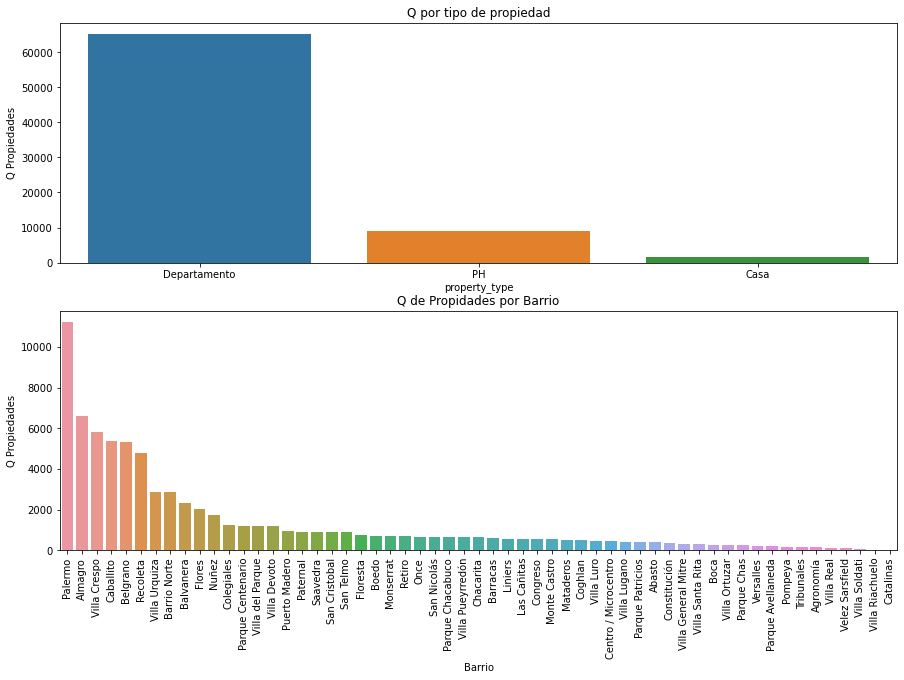

In [22]:
#Orden por Barrio
barr_prop = capital['Barrio'].value_counts()
orden_barr = barr_prop.index

#Orden por tipo de propiedad
tip_prop = capital['property_type'].value_counts()
orden_prop = tip_prop.index

#Tamaño del gráfico
plt.figure(figsize = (15,15))


plt.subplot(3,1,3)
sns.countplot(data = capital, x = 'Barrio', order = orden_barr)
plt.xticks(rotation=90)
plt.xlabel('Barrio')
plt.ylabel('Q Propiedades')
plt.title('Q de Propidades por Barrio')

plt.subplot(3,1,2)
sns.countplot(data = capital, x = 'property_type', order = orden_prop)
plt.xticks(rotation=0)
plt.xlabel('property_type')
plt.ylabel('Q Propiedades')
plt.title('Q por tipo de propiedad')

In [23]:
capital.describe(include='all')

,lat,lon,Barrio,rooms,bedrooms,bathrooms,surface_total,surface_covered,price,property_type
count,71973.000000,71973.000000,75617,75617.000000,75617.000000,75617.000000,75617.000000,75617.000000,75617.000000,75617
unique,NaN,NaN,57,NaN,NaN,NaN,NaN,NaN,NaN,3
top,NaN,NaN,Palermo,NaN,NaN,NaN,NaN,NaN,NaN,Departamento
freq,NaN,NaN,11218,NaN,NaN,NaN,NaN,NaN,NaN,65102
mean,-34.598551,-58.436030,NaN,2.838370,1.872674,1.414391,83.606213,71.865242,211405.159012,NaN
std,0.023329,0.035306,NaN,1.064174,0.881240,0.621313,58.793397,42.116885,134519.845127,NaN
min,-34.696419,-58.530468,NaN,1.000000,0.000000,1.000000,10.000000,1.000000,6000.000000,NaN
25%,-34.612294,-58.458785,NaN,2.000000,1.000000,1.000000,48.000000,44.000000,120000.000000,NaN
50%,-34.598972,-58.433783,NaN,3.000000,2.000000,1.000000,68.000000,60.000000,170000.000000,NaN
75%,-34.584880,-58.411700,NaN,4.000000,2.000000,2.000000,100.000000,86.000000,258000.000000,NaN


## Mapa de Calor de Correlaciones

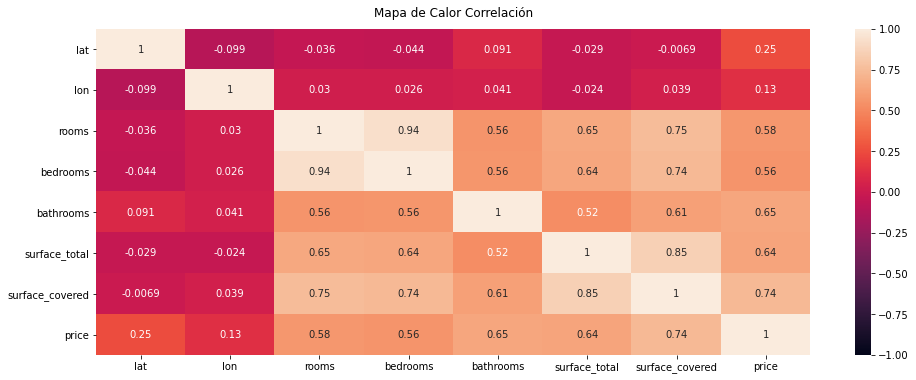

In [24]:
# Increase the size of the heatmap.
plt.figure(figsize=(16, 6))
# Store heatmap object in a variable to easily access it when you want to include more features (such as title).
# Set the range of values to be displayed on the colormap from -1 to 1, and set the annotation to True to display the correlation values on the heatmap.
heatmap = sns.heatmap(capital.corr(), vmin=-1, vmax=1, annot=True)
# Give a title to the heatmap. Pad defines the distance of the title from the top of the heatmap.
heatmap.set_title('Mapa de Calor Correlación', fontdict={'fontsize':12}, pad=12);

De esta manera hemos eliminado por rango intercuartílico los outliers. Podemos proceder a tratar los nulos y faltantes.

## Nulos y Faltantes

In [25]:
capital.isnull().sum()

lat                3644
lon                3644
Barrio                0
rooms                 0
bedrooms              0
bathrooms             0
surface_total         0
surface_covered       0
price                 0
property_type         0
dtype: int64

In [26]:
print('PORCENTAJE DE NULOS')
for col in capital.columns:
    nulos = capital[col].isna().sum()
    print(col, "{:.2f}%".format(nulos*100/146660))

PORCENTAJE DE NULOS
lat 2.48%
lon 2.48%
Barrio 0.00%
rooms 0.00%
bedrooms 0.00%
bathrooms 0.00%
surface_total 0.00%
surface_covered 0.00%
price 0.00%
property_type 0.00%


In [27]:
capital.columns

Index(['lat', 'lon', 'Barrio', 'rooms', 'bedrooms', 'bathrooms',
       'surface_total', 'surface_covered', 'price', 'property_type'],
      dtype='object')

In [28]:
lon_barrio = capital[['lon', 'Barrio']].groupby('Barrio').agg(pd.Series.mean)
lat_barrio = capital[['lat', 'Barrio']].groupby('Barrio').agg(pd.Series.mean)
capital = capital.set_index('Barrio')
capital.lon.fillna(lon_barrio.to_dict()['lon'], inplace=True)
capital.lat.fillna(lat_barrio.to_dict()['lat'], inplace=True)
capital = capital.reset_index()
capital.head(5)

,Barrio,lat,lon,rooms,bedrooms,bathrooms,surface_total,surface_covered,price,property_type
0,Boedo,-34.624056,-58.412110,2.0,1.0,2.0,70.0,58.0,159000.0,PH
1,Palermo,-34.593569,-58.427474,2.0,1.0,1.0,45.0,45.0,125000.0,PH
2,Palermo,-34.581294,-58.436754,2.0,1.0,1.0,85.0,50.0,295000.0,PH
3,Villa Crespo,-34.593779,-58.441239,2.0,1.0,1.0,56.0,56.0,150000.0,PH
4,Villa Crespo,-34.600988,-58.433061,2.0,1.0,1.0,70.0,70.0,159500.0,PH


In [29]:
capital.groupby('property_type').agg({'surface_covered':['min','mean','max']})

surface_covered                   
                          min        mean    max
property_type                                   
Casa                     25.0  169.613106  532.0
Departamento              1.0   66.667383  487.0
PH                        1.0   92.392249  520.0

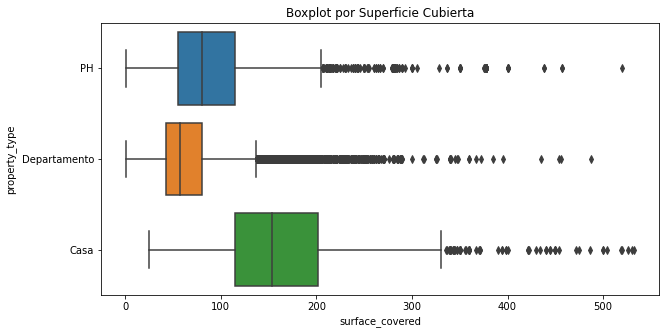

In [30]:
plt.figure(figsize=(10,5))
sns.boxplot(x='surface_covered', y='property_type',data=capital)
plt.title('Boxplot por Superficie Cubierta')
plt.show()

## Copia del DataSet

A partir de este punto empezaremos a trabajar con una copia del dataset para no comprometer su integridad, a la hora de transformar los datos mediante el Re-escalado con Z-score y el One Hot Encoding de variables categóricas

In [31]:
capital_copia = capital.copy()

 ### Incorporamos Precio por metro cuadrado

In [32]:
capital_copia['pricem2']=capital_copia["price"]/capital_copia["surface_covered"]

### Re-Escalado de Datos Z score

In [33]:
capital_copia.columns

Index(['Barrio', 'lat', 'lon', 'rooms', 'bedrooms', 'bathrooms',
       'surface_total', 'surface_covered', 'price', 'property_type',
       'pricem2'],
      dtype='object')

In [34]:
## Reescalado Superficie Cubierta
from sklearn.preprocessing import StandardScaler
X = np.array(capital_copia['surface_covered']).reshape(-1,1)
scaler = StandardScaler()
scaler.fit(X)
X_scaled = scaler.transform(X)
capital_copia['surface_covered'] = X_scaled.reshape(1,-1)[0]

In [35]:
## Reescalado Habitaciones
from sklearn.preprocessing import StandardScaler
X = np.array(capital_copia['rooms']).reshape(-1,1)
scaler = StandardScaler()
scaler.fit(X)
X_scaled = scaler.transform(X)
capital_copia['rooms'] = X_scaled.reshape(1,-1)[0]

In [36]:
## Reescalado Dormitorios
from sklearn.preprocessing import StandardScaler
X = np.array(capital_copia['bedrooms']).reshape(-1,1)
scaler = StandardScaler()
scaler.fit(X)
X_scaled = scaler.transform(X)
capital_copia['bedrooms'] = X_scaled.reshape(1,-1)[0]

In [37]:
## Reescaldado Baños
from sklearn.preprocessing import StandardScaler
X = np.array(capital_copia['bathrooms']).reshape(-1,1)
scaler = StandardScaler()
scaler.fit(X)
X_scaled = scaler.transform(X)
capital_copia['bathrooms'] = X_scaled.reshape(1,-1)[0]

In [38]:
## Reescalado Superficie Total
from sklearn.preprocessing import StandardScaler
X = np.array(capital_copia['surface_total']).reshape(-1,1)
scaler = StandardScaler()
scaler.fit(X)
X_scaled = scaler.transform(X)
capital_copia['surface_total'] = X_scaled.reshape(1,-1)[0]

In [39]:
## Reescalado Latitud 
from sklearn.preprocessing import StandardScaler
X = np.array(capital_copia['lat']).reshape(-1,1)
scaler = StandardScaler()
scaler.fit(X)
X_scaled = scaler.transform(X)
capital_copia['lat'] = X_scaled.reshape(1,-1)[0]

In [40]:
## Reescalado Longitud
from sklearn.preprocessing import StandardScaler
X = np.array(capital_copia['lon']).reshape(-1,1)
scaler = StandardScaler()
scaler.fit(X)
X_scaled = scaler.transform(X)
capital_copia['lon'] = X_scaled.reshape(1,-1)[0]

In [41]:
## Reescalado Preico m2
from sklearn.preprocessing import StandardScaler
X = np.array(capital_copia['pricem2']).reshape(-1,1)
scaler = StandardScaler()
scaler.fit(X)
X_scaled = scaler.transform(X)
capital_copia['pricem2'] = X_scaled.reshape(1,-1)[0]

In [42]:
capital_copia.head(5)

,Barrio,lat,lon,rooms,bedrooms,bathrooms,surface_total,surface_covered,price,property_type,pricem2
0,Boedo,-1.112904,0.662822,-0.787818,-0.990287,0.942540,-0.231426,-0.329211,159000.0,PH,-0.086855
1,Palermo,0.202202,0.225298,-0.787818,-0.990287,-0.666964,-0.656646,-0.637878,125000.0,PH,-0.076234
2,Palermo,0.731706,-0.038977,-0.787818,-0.990287,-0.666964,0.023707,-0.519160,295000.0,PH,0.834867
3,Villa Crespo,0.193140,-0.166693,-0.787818,-0.990287,-0.666964,-0.469549,-0.376698,150000.0,PH,-0.105184
4,Villa Crespo,-0.117838,0.066179,-0.787818,-0.990287,-0.666964,-0.231426,-0.044288,159500.0,PH,-0.221908


### One Hot Encoding

En esta sección realizaremos un encoding de las variables categóricas "property_type" y "Barrio" para poder incorporarlas como variables independientes (X) en nuestros modelos de Machine Learning

In [43]:
capital_copia=pd.get_dummies(capital_copia, columns=["property_type"])

In [44]:
capital_copia=pd.get_dummies(capital_copia, columns=["Barrio"])

In [45]:
capital_copia.head()

,lat,lon,rooms,bedrooms,bathrooms,surface_total,surface_covered,price,pricem2,property_type_Casa,...,Barrio_Villa Lugano,Barrio_Villa Luro,Barrio_Villa Ortuzar,Barrio_Villa Pueyrredón,Barrio_Villa Real,Barrio_Villa Riachuelo,Barrio_Villa Santa Rita,Barrio_Villa Soldati,Barrio_Villa Urquiza,Barrio_Villa del Parque
0,-1.112904,0.662822,-0.787818,-0.990287,0.942540,-0.231426,-0.329211,159000.0,-0.086855,0,...,0,0,0,0,0,0,0,0,0,0
1,0.202202,0.225298,-0.787818,-0.990287,-0.666964,-0.656646,-0.637878,125000.0,-0.076234,0,...,0,0,0,0,0,0,0,0,0,0
2,0.731706,-0.038977,-0.787818,-0.990287,-0.666964,0.023707,-0.519160,295000.0,0.834867,0,...,0,0,0,0,0,0,0,0,0,0
3,0.193140,-0.166693,-0.787818,-0.990287,-0.666964,-0.469549,-0.376698,150000.0,-0.105184,0,...,0,0,0,0,0,0,0,0,0,0
4,-0.117838,0.066179,-0.787818,-0.990287,-0.666964,-0.231426,-0.044288,159500.0,-0.221908,0,...,0,0,0,0,0,0,0,0,0,0


Tal cual lo esperado, codificar las etiquetas de las propiedades agranda el dataset en cantidad de columnas. Evaluaré esto a la hora de implementar los modelos. En principio, antes de utilizar los modelos avanzados, utilizaré este dataset para comparar el desempeño del modelo 01. 

## COMPARACION CON EL MODELO DEL PRIMER PROYECTO

### Modelo 02

Utilizaremos los mismos modelos del Primer Proyecto, para evaluar si un preprocesamiento más rico de los datos tiene un impacto significativo en la capacidad predictiva de estos.

In [46]:
X = capital_copia.drop(["price"],axis = 1)
y = capital_copia.price


In [47]:
#Diseño el modelo de train y test 02
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)

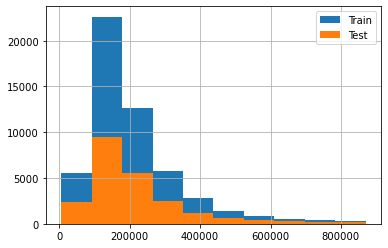

In [48]:
## Me aseguro de que los conjuntos train y test tengan una distribución similar
y_train.hist(label = 'Train')
y_test.hist(label = 'Test')
plt.legend()
plt.show()

In [49]:
#importo librerias
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor

In [50]:
#Defino los modelos de ML con los mismos hiperparámetros que en los modelos 01
modelo_lineal2 = LinearRegression()
arbol_regresor2 = DecisionTreeRegressor(max_depth=8, random_state=42)
vecinos_regresor2 = KNeighborsRegressor(n_neighbors=20)

In [51]:
#Vuelvo a entrenar los modelos
modelo_lineal2.fit(X_train, y_train)
arbol_regresor2.fit(X_train, y_train)
vecinos_regresor2.fit(X_train, y_train)

KNeighborsRegressor(n_neighbors=20)

Modelo: Regresión lineal
Raíz del error cuadrático medio en Train: 65107.86858453651
Raíz del error cuadrático medio en Test: 63483.89675149157


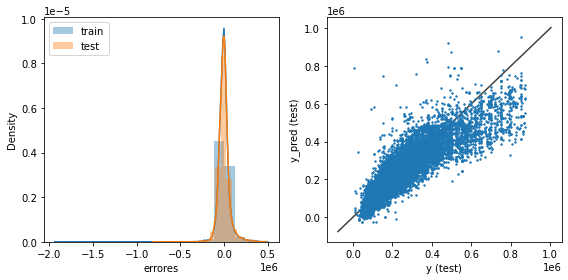

Modelo: Árbol de Decisión
Raíz del error cuadrático medio en Train: 13172.660017530467
Raíz del error cuadrático medio en Test: 14082.726697784443


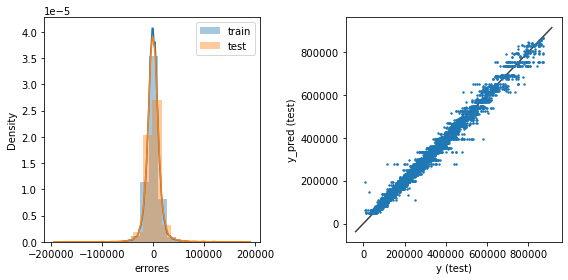

Modelo: Vecinos más cercanos
Raíz del error cuadrático medio en Train: 36365.153487937285
Raíz del error cuadrático medio en Test: 38951.734980005465


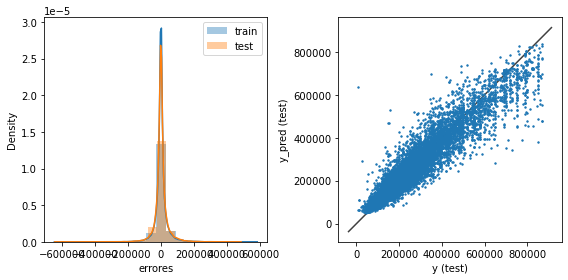

In [52]:
#Vuelvo a graficar las métricas de los modelos
from sklearn.metrics import mean_squared_error
import seaborn as sns
modelos = ['Regresión lineal', 'Árbol de Decisión', 'Vecinos más cercanos']

for i, model in enumerate([modelo_lineal2, arbol_regresor2, vecinos_regresor2]):
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    
    
    print(f'Modelo: {modelos[i]}')

    rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred))
    rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))
    print(f'Raíz del error cuadrático medio en Train: {rmse_train}')
    print(f'Raíz del error cuadrático medio en Test: {rmse_test}')
    
    plt.figure(figsize = (8,4))

    plt.subplot(1,2,1)
    sns.distplot(y_train - y_train_pred, bins = 20, label = 'train')
    sns.distplot(y_test - y_test_pred, bins = 20, label = 'test')
    plt.xlabel('errores')
    plt.legend()


    ax = plt.subplot(1,2,2)
    ax.scatter(y_test,y_test_pred, s =2)
    
    lims = [
    np.min([ax.get_xlim(), ax.get_ylim()]),  # min of both axes
    np.max([ax.get_xlim(), ax.get_ylim()]),  # max of both axes]
    ]
    
    ax.plot(lims, lims, 'k-', alpha=0.75, zorder=0)
    plt.xlabel('y (test)')
    plt.ylabel('y_pred (test)')
    
    plt.tight_layout()
    plt.show()

En el modelo del primer proyecto el modelo de ML, que menos error tenía era el de vecinos más cercanos. Este tenía una raíz del error cuadrático medio en Test: 228.139,04.
En este segundo modelo, aplicando las técnicas de preprocesamiento de datos, hemos tenido una mejora imperesionante, especialmente en el Modelo de Árbol de Decisión con las siguientes métricas:
Raíz del error cuadrático medio en Train: 56.558,06
Raíz del error cuadrático medio en Test: 57.127,31. Como vemos no existe una gran varianza entre train y test.

Continuando con las técnicas de preprocesamiento hemos alcanzando un error cuadrático medio de 13.172 para el conjunto de train y 14.082 para el conjunto de test

## PARTE B - Modelos Avanzados

Elige dos de los modelos avanzados vistos Compara con el desempeño obtenido en el proyecto 01 (en el caso de regresión, considera una regresión lineal con atributos polinómicos y regularización). 
    
    1. Entrénalos y evalúalos con sus argumentos por defecto. 
    2. No te olvides de hacer un train/test split y usar Validación Cruzada.
    3. Optimiza sus hiperparámetros mediante Validación Cruzada y Grid Search o Random Search.

Compara el desempeño de los nuevos modelos entre sí y con el modelo de la Parte A. ¿Cuál elegirías? Justifica.

### Random Forest

#### Train-Test Split

In [53]:
# Dividimos los datos en entrenamiento y prueba
from sklearn.model_selection import train_test_split

# X son nuestras variables independientes
X = capital_copia.drop(["price"],axis = 1)

# y es nuestra variable dependiente
y = capital_copia.price

# División 75% de datos para entrenamiento, 25% de daatos para test
X_train, X_test, y_train, y_test = train_test_split(X, y,random_state=0)

Nos aseguramos de que ambos conjuntos (train y test) tengan una distribución similar

In [54]:
print('Proporcion de etiquetas positiva en los datos de Train: ', y_train.sum()/y_train.size)
print('Proporcion de etiquetas positiva en los datos de Test: ', y_test.sum()/y_test.size)

Proporcion de etiquetas positiva en los datos de Train:  211652.4666913528
Proporcion de etiquetas positiva en los datos de Test:  210663.27521819624


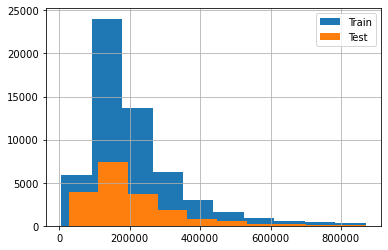

In [55]:
y_train.hist(label = 'Train')
y_test.hist(label = 'Test')
plt.legend()
plt.show()

Los conjuntos train y test tienen una distribución similar.

#### Creación del Modelo

In [56]:
# Creaamos el modelo de Bosques Aleatorios (y configuramos el número de estimadores (árboles de decisión))
from sklearn.ensemble import RandomForestRegressor

BA_model = RandomForestRegressor(n_estimators = 10, 
                                  random_state = 2016,
                                  min_samples_leaf = 8,)


#### Entrenar el Modelo


In [57]:
BA_model.fit(X_train, y_train)


RandomForestRegressor(min_samples_leaf=8, n_estimators=10, random_state=2016)

#### Predecir sobre el conjunto de entrenamiento y sobre el de prueba

In [58]:
# Predecimos sobre nuestro set de entrenamieto
y_train_pred = BA_model.predict(X_train)

# Predecimos sobre nuestro set de test
y_test_pred = BA_model.predict(X_test)


#### Evaluamos con una métrica apropiada para un problema de Regresión

In [59]:
rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred))
rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))
print(f'Raíz del error cuadrático medio en Train: {rmse_train}')
print(f'Raíz del error cuadrático medio en Test: {rmse_test}')

Raíz del error cuadrático medio en Train: 4600.306623067424
Raíz del error cuadrático medio en Test: 5593.065296512863


Podemos ver que comparados con los modelos anteriores más simples hay una mejora muy significativa, en cuanto el error cuadrático medio disminuye a 4600 dólares para Train y a 5.593 dólares para Test.

### Optimización de hiperparámetros


El modelo inicial se ha entrenado utilizando 10 árboles (n_estimators=10) y manteniendo el resto de hiperparámetros con su valor por defecto. Al ser hiperparámetros, no se puede saber de antemano cuál es el valor más adecuado, la forma de identificarlos es mediante el uso de estrategias de validación, por ejemplo validación cruzada.



#### Grid Search con validación cruzada

Aunque el análisis individual de los hiperparámetros es útil para entender su impacto en el modelo e identificar rangos de interés, la búsqueda final no debe hacerse de forma secuencial, ya que cada hiperparámetro interacciona con los demás. Es preferible recurrir a grid search o random search para analizar varias combinaciones de hiperparámetros.

Valor óptimo de max_features: 64


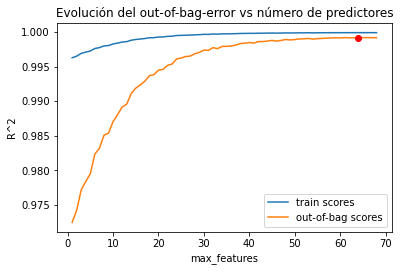

In [60]:
# Validación empleando el Out-of-Bag error
# ==============================================================================
train_scores = []
oob_scores   = []

# Valores evaluados
max_features_range = range(1, X_train.shape[1] + 1, 1)

# Bucle para entrenar un modelo con cada valor de max_features y extraer su error
# de entrenamiento y de Out-of-Bag.
for max_features in max_features_range:
    modelo = RandomForestRegressor(
                n_estimators = 100,
                criterion    = 'mse',
                max_depth    = None,
                max_features = max_features,
                oob_score    = True,
                n_jobs       = -1,
                random_state = 123
             )
    modelo.fit(X_train, y_train)
    train_scores.append(modelo.score(X_train, y_train))
    oob_scores.append(modelo.oob_score_)
    
# Gráfico con la evolución de los errores
fig, ax = plt.subplots(figsize=(6, 3.84))
ax.plot(max_features_range, train_scores, label="train scores")
ax.plot(max_features_range, oob_scores, label="out-of-bag scores")
ax.plot(max_features_range[np.argmax(oob_scores)], max(oob_scores),
        marker='o', color = "red")
ax.set_ylabel("R^2")
ax.set_xlabel("max_features")
ax.set_title("Evolución del out-of-bag-error vs número de predictores")
plt.legend();
print(f"Valor óptimo de max_features: {max_features_range[np.argmax(oob_scores)]}")

In [61]:
# Grid de hiperparámetros evaluados
# ==============================================================================
param_grid = {'n_estimators': [150],
              'max_features': [5, 7, 9],
              'max_depth'   : [3, 10, 20]
             }

# Búsqueda por grid search con validación cruzada
# ==============================================================================
grid = GridSearchCV(
        estimator  = RandomForestRegressor(random_state = 123),
        param_grid = param_grid,
        scoring    = 'neg_root_mean_squared_error',
        n_jobs     = multiprocessing.cpu_count() - 1,
        cv         = RepeatedKFold(n_splits=5, n_repeats=3, random_state=123), 
        refit      = True,
        verbose    = 0,
        return_train_score = True
       )

grid.fit(X = X_train, y = y_train)

# Resultados
# ==============================================================================
resultados = pd.DataFrame(grid.cv_results_)
resultados.filter(regex = '(param.*|mean_t|std_t)') \
    .drop(columns = 'params') \
    .sort_values('mean_test_score', ascending = False) \
    .head(4)

,param_max_depth,param_max_features,param_n_estimators,mean_test_score,std_test_score,mean_train_score,std_train_score
8,20,9,150,-17747.068689,615.113096,-9195.199685,100.343443
7,20,7,150,-20561.496470,542.066918,-12191.359453,167.910803
6,20,5,150,-24708.026396,606.888573,-17305.115711,206.081605
5,10,9,150,-35156.831570,928.742495,-33204.163167,513.867511


In [62]:
# Mejores hiperparámetros por validación cruzada
# ==============================================================================
print("----------------------------------------")
print("Mejores hiperparámetros encontrados (cv)")
print("----------------------------------------")
print(grid.best_params_, ":", grid.best_score_, grid.scoring)

----------------------------------------
Mejores hiperparámetros encontrados (cv)
----------------------------------------
{'max_depth': 20, 'max_features': 9, 'n_estimators': 150} : -17747.0686886941 neg_root_mean_squared_error


Una vez identificados los mejores hiperparámetros, se reentrena el modelo indicando los valores óptimos en sus argumentos. Si en el GridSearchCV() se indica refit=True, este reentrenamiento se hace automáticamente y el modelo resultante se encuentra almacenado en .best_estimator_.

In [63]:
# Error de test del modelo final
# ==============================================================================
modelo_final_rf = grid.best_estimator_
predicciones = modelo.predict(X = X_test)
rmse = mean_squared_error(
        y_true  = y_test,
        y_pred  = predicciones,
        squared = False
       )
print(f"El error (rmse) de test es: {rmse}")

El error (rmse) de test es: 3773.6867196571097


Tras optimizar los hiperparámetros, se consigue reducir el error rmse del modelo a 3.773. Las predicciones del modelo final se alejan en promedio 3.773 unidades (3.773 dólares) del valor real.

### Importancia de predictores¶


#### Importancia por pureza de nodos


In [64]:
importancia_predictores = pd.DataFrame(
                            {'predictor': X_train.columns,
                             'importancia': modelo_final_rf.feature_importances_}
                            )
print("Importancia de los predictores en el modelo")
print("-------------------------------------------")
importancia_predictores.sort_values('importancia', ascending=False)

Importancia de los predictores en el modelo
-------------------------------------------


,predictor,importancia
6,surface_covered,2.295324e-01
5,surface_total,2.175119e-01
7,pricem2,1.863259e-01
4,bathrooms,8.255314e-02
2,rooms,6.563319e-02
...,...,...
62,Barrio_Villa Real,4.899797e-05
64,Barrio_Villa Santa Rita,3.426486e-05
53,Barrio_Velez Sarsfield,2.310383e-05
63,Barrio_Villa Riachuelo,1.215566e-05


#### Importancia por permutaciones


In [65]:
importancia = permutation_importance(
                estimator    = modelo_final_rf,
                X            = X_train,
                y            = y_train,
                n_repeats    = 5,
                scoring      = 'neg_root_mean_squared_error',
                n_jobs       = multiprocessing.cpu_count() - 1,
                random_state = 123
             )

# Se almacenan los resultados (media y desviación) en un dataframe
df_importancia = pd.DataFrame(
                    {k: importancia[k] for k in ['importances_mean', 'importances_std']}
                 )
df_importancia['feature'] = X_train.columns
df_importancia.sort_values('importances_mean', ascending=False)

,importances_mean,importances_std,feature
7,67724.441084,154.072007,pricem2
6,66332.424082,173.144446,surface_covered
5,47884.049697,166.756103,surface_total
0,16087.703200,133.594459,lat
4,14048.771824,57.402934,bathrooms
...,...,...,...
64,7.063893,0.758705,Barrio_Villa Santa Rita
11,6.520374,0.267965,Barrio_Abasto
63,3.110311,0.066551,Barrio_Villa Riachuelo
53,2.484813,0.393609,Barrio_Velez Sarsfield


####  Gráfico

<AxesSubplot:>

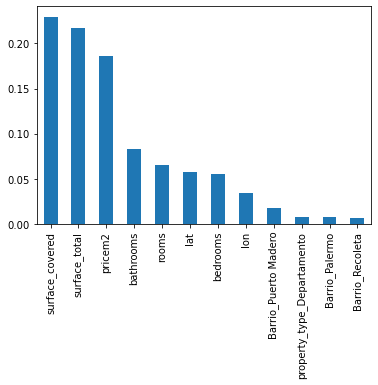

In [66]:
feat_importances = pd.Series(modelo_final_rf.feature_importances_, index=X.columns)
feat_importances.nlargest(12).plot(kind='bar')

Según se observa, superficie cubierta, superficie total, precio por metro cuadraro y baños son las features más importantes para este modelo a la hora de predecir el precio final de una vivienda.

## XGBOOST

In [67]:
# División de los datos en train y test
# ==============================================================================
# X son nuestras variables independientes
X = capital_copia.drop(["price"],axis = 1)

# y es nuestra variable dependiente
y = capital_copia.price

# División 75% de datos para entrenamiento, 25% de daatos para test
X_train, X_test, y_train, y_test = train_test_split(X, y,random_state=0)
# Creación del modelo


## Creación del Modelo

In [68]:
from xgboost import XGBRegressor

## Grid Search

In [69]:
# Grid de hiperparámetros evaluados
# ==============================================================================
param_grid = {'max_depth'        : [None, 1, 3, 5, 10, 20],
              'subsample'        : [0.5, 1],
              'learning_rate'    : [0.001, 0.01, 0.1],
              'booster'          : ['gbtree']
             }


# Crear conjunto de validación
# ==============================================================================
np.random.seed(123)
idx_validacion = np.random.choice(
                    X_train.shape[0],
                    size= int(X_train.shape[0]*0.1),
                    replace=False
                 )

X_val = X_train.iloc[idx_validacion, :].copy()
y_val = y_train.iloc[idx_validacion].copy()

X_train_grid = X_train.reset_index(drop = True).drop(idx_validacion, axis = 0).copy()
y_train_grid = y_train.reset_index(drop = True).drop(idx_validacion, axis = 0).copy()

# XGBoost necesita pasar los paramétros específicos del entrenamiento al llamar
# al método .fit()
fit_params = {"early_stopping_rounds" : 5, 
              "eval_metric"           : "rmse", 
              "eval_set"              : [(X_val, y_val)],
              "verbose"               : 0
             }

# Búsqueda por grid search con validación cruzada
# ==============================================================================
grid = GridSearchCV(
        estimator  = XGBRegressor(
                        n_estimators = 1000,
                        random_state = 123
                    ),
        param_grid = param_grid,
        scoring    = 'neg_root_mean_squared_error',
        n_jobs     = multiprocessing.cpu_count() - 1,
        cv         = RepeatedKFold(n_splits=3, n_repeats=1, random_state=123), 
        refit      = True,
        verbose    = 0,
        return_train_score = True
       )

grid.fit(X = X_train_grid, y = y_train_grid, **fit_params)

# Resultados
# ==============================================================================
resultados = pd.DataFrame(grid.cv_results_)
resultados.filter(regex = '(param.*|mean_t|std_t)') \
    .drop(columns = 'params') \
    .sort_values('mean_test_score', ascending = False) \
    .head(4)

,param_booster,param_learning_rate,param_max_depth,param_subsample,mean_test_score,std_test_score,mean_train_score,std_train_score
22,gbtree,0.01,20,0.5,-3954.561874,697.309262,-1017.573510,393.655574
20,gbtree,0.01,10,0.5,-4066.719753,664.181711,-1449.973358,285.385941
34,gbtree,0.1,20,0.5,-4303.016028,742.554985,-1056.815070,286.841963
32,gbtree,0.1,10,0.5,-4429.627962,536.226193,-1638.930363,471.483027


In [70]:
# Mejores hiperparámetros por validación cruzada
# ==============================================================================
print("----------------------------------------")
print("Mejores hiperparámetros encontrados (cv)")
print("----------------------------------------")
print(grid.best_params_, ":", grid.best_score_, grid.scoring)

# Número de árboles del modelo final (early stopping)
# ==============================================================================
n_arboles_incluidos = len(grid.best_estimator_.get_booster().get_dump())
print(f"Número de árboles incluidos en el modelo: {n_arboles_incluidos}")

----------------------------------------
Mejores hiperparámetros encontrados (cv)
----------------------------------------
{'booster': 'gbtree', 'learning_rate': 0.01, 'max_depth': 20, 'subsample': 0.5} : -3954.5618742038428 neg_root_mean_squared_error
Número de árboles incluidos en el modelo: 712


In [71]:
# Error de test del modelo final
# ==============================================================================
modelo_final_xgb = grid.best_estimator_
predicciones = modelo_final_xgb.predict(X_test)
rmse = mean_squared_error(
        y_true  = y_test,
        y_pred  = predicciones,
        squared = False
       )
print(f"El error (rmse) de test es: {rmse}")

El error (rmse) de test es: 3852.247797082786


In [72]:
## Importancia por pureza de nodos


In [73]:
importancia_predictores = pd.DataFrame(
                            {'predictor': X_train.columns,
                             'importancia': modelo_final_xgb.feature_importances_}
                            )
print("Importancia de los predictores en el modelo")
print("-------------------------------------------")
importancia_predictores.sort_values('importancia', ascending=False)

Importancia de los predictores en el modelo
-------------------------------------------


,predictor,importancia
6,surface_covered,6.502850e-01
7,pricem2,2.210038e-01
5,surface_total,1.203246e-01
2,rooms,9.649743e-04
3,bedrooms,8.270096e-04
...,...,...
51,Barrio_San Telmo,5.497618e-06
53,Barrio_Velez Sarsfield,4.889731e-06
18,Barrio_Boca,2.774359e-06
63,Barrio_Villa Riachuelo,2.720811e-06


## Importancia por permutación

In [74]:
importancia = permutation_importance(
                estimator    = modelo_final_xgb,
                X            = X_train,
                y            = y_train,
                n_repeats    = 5,
                scoring      = 'neg_root_mean_squared_error',
                n_jobs       = multiprocessing.cpu_count() - 1,
                random_state = 123
             )

# Se almacenan los resultados (media y desviación) en un dataframe
df_importancia = pd.DataFrame(
                    {k: importancia[k] for k in ['importances_mean', 'importances_std']}
                 )
df_importancia['feature'] = X_train.columns
df_importancia.sort_values('importances_mean', ascending=False)

,importances_mean,importances_std,feature
6,166688.920240,449.104107,surface_covered
7,116005.015188,230.947962,pricem2
5,9605.340164,107.401231,surface_total
0,904.553522,139.762477,lat
1,694.414140,38.086116,lon
...,...,...,...
53,0.030908,0.003529,Barrio_Velez Sarsfield
58,0.013885,0.001463,Barrio_Villa Lugano
21,0.000110,0.000002,Barrio_Catalinas
18,0.000021,0.000314,Barrio_Boca


<AxesSubplot:>

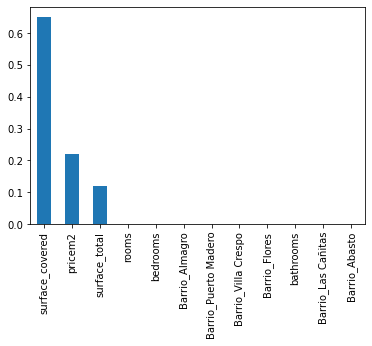

In [75]:
# Gráfico
feat_importances = pd.Series(modelo_final_xgb.feature_importances_, index=X.columns)
feat_importances.nlargest(12).plot(kind='bar')

Según se observa, superficie cubierta, precio por metro cuadraro y superficie total son las features más importantes para este modelo a la hora de predecir el precio final de una vivienda.

Tras optimizar los hiperparámetros, se consigue reducir el error rmse del modelo a 23.815. Las predicciones del modelo final se alejan en promedio 24.119 unidades (24.119 dólares) del valor real.

Modelo: Random Forest
Raíz del error cuadrático medio en Train: 8939.743360308372
Raíz del error cuadrático medio en Test: 16500.138304657907


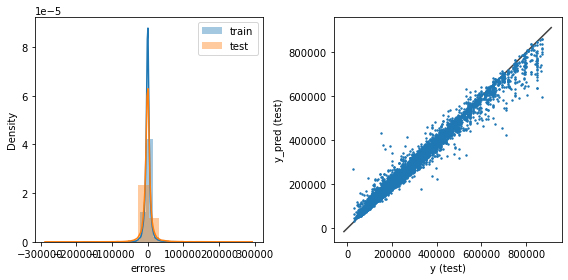

Modelo: X G BOOST
Raíz del error cuadrático medio en Train: 1172.4473820383769
Raíz del error cuadrático medio en Test: 3852.247797082786


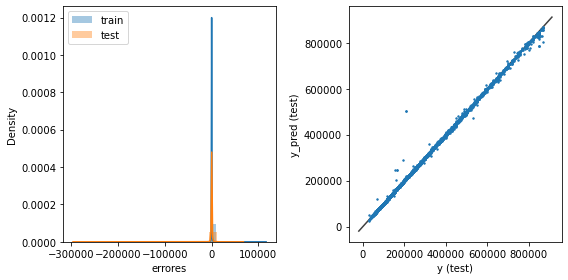

In [76]:
#Vuelvo a graficar las métricas de los modelos
from sklearn.metrics import mean_squared_error
import seaborn as sns
modelos = ['Random Forest', 'X G BOOST']

for i, model in enumerate([modelo_final_rf, modelo_final_xgb]):
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    
    
    print(f'Modelo: {modelos[i]}')

    rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred))
    rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))
    print(f'Raíz del error cuadrático medio en Train: {rmse_train}')
    print(f'Raíz del error cuadrático medio en Test: {rmse_test}')
    
    plt.figure(figsize = (8,4))

    plt.subplot(1,2,1)
    sns.distplot(y_train - y_train_pred, bins = 20, label = 'train')
    sns.distplot(y_test - y_test_pred, bins = 20, label = 'test')
    plt.xlabel('errores')
    plt.legend()


    ax = plt.subplot(1,2,2)
    ax.scatter(y_test,y_test_pred, s =2)
    
    lims = [
    np.min([ax.get_xlim(), ax.get_ylim()]),  # min of both axes
    np.max([ax.get_xlim(), ax.get_ylim()]),  # max of both axes]
    ]
    
    ax.plot(lims, lims, 'k-', alpha=0.75, zorder=0)
    plt.xlabel('y (test)')
    plt.ylabel('y_pred (test)')
    
    plt.tight_layout()
    plt.show()

Tanto el modelo de Random Forest como el de X G Boost presentan una diferencia muy importante en los errores cuadráticos medios de los conjuntos train y test. En efecto, ambos presentan una performance mejor en el conjunto de entrenamiento, lo cual nos induce a pensar que puede haber sobreajuste. Esto puede ser un punto importante para mejorar en el proyecto de cierre de la carrera.

# CLUSTERING

Comenzamos aplicando reducción de dimensionalidad mediante PCA.

### Reducción de Dimensionalidad

In [77]:
# Tratamiento de datos
# ==============================================================================
import numpy as np
import pandas as pd
import statsmodels.api as sm

# Gráficos
# ==============================================================================
import matplotlib.pyplot as plt
import matplotlib.font_manager
from matplotlib import style
style.use('ggplot') or plt.style.use('ggplot')

# Preprocesado y modelado
# ==============================================================================
from sklearn.decomposition import PCA
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import scale

# Configuración warnings
# ==============================================================================
import warnings
warnings.filterwarnings('ignore')

In [78]:
capital.head()

,Barrio,lat,lon,rooms,bedrooms,bathrooms,surface_total,surface_covered,price,property_type
0,Boedo,-34.624056,-58.412110,2.0,1.0,2.0,70.0,58.0,159000.0,PH
1,Palermo,-34.593569,-58.427474,2.0,1.0,1.0,45.0,45.0,125000.0,PH
2,Palermo,-34.581294,-58.436754,2.0,1.0,1.0,85.0,50.0,295000.0,PH
3,Villa Crespo,-34.593779,-58.441239,2.0,1.0,1.0,56.0,56.0,150000.0,PH
4,Villa Crespo,-34.600988,-58.433061,2.0,1.0,1.0,70.0,70.0,159500.0,PH


In [79]:
capital_nuevo=capital.drop(['Barrio',"property_type"], axis=1)


In [80]:
# Entrenamiento modelo PCA con escalado de los datos
# ==============================================================================
pca_pipe = make_pipeline(StandardScaler(), PCA())
pca_pipe.fit(capital_nuevo)

# Se extrae el modelo entrenado del pipeline
modelo_pca = pca_pipe.named_steps['pca']

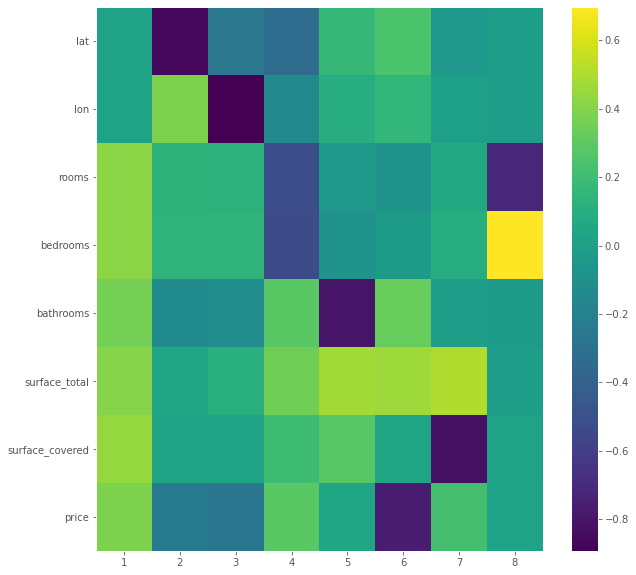

In [81]:
# Heatmap componentes
# ==============================================================================
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(10, 10))
componentes = modelo_pca.components_
plt.imshow(componentes.T, cmap='viridis', aspect='auto')
plt.yticks(range(len(capital_nuevo.columns)), capital_nuevo.columns)
plt.xticks(range(len(capital_nuevo.columns)), np.arange(modelo_pca.n_components_) + 1)
plt.grid(False)
plt.colorbar();

----------------------------------------------------
Porcentaje de varianza explicada por cada componente
----------------------------------------------------
[0.54411446 0.14272674 0.12636122 0.07029536 0.06259338 0.03133416
 0.01454416 0.00803051]


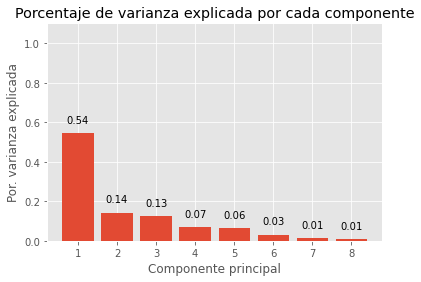

In [82]:
# Porcentaje de varianza explicada por cada componente
# ==============================================================================
print('----------------------------------------------------')
print('Porcentaje de varianza explicada por cada componente')
print('----------------------------------------------------')
print(modelo_pca.explained_variance_ratio_)

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(6, 4))
ax.bar(
    x      = np.arange(modelo_pca.n_components_) + 1,
    height = modelo_pca.explained_variance_ratio_
)

for x, y in zip(np.arange(len(capital_nuevo.columns)) + 1, modelo_pca.explained_variance_ratio_):
    label = round(y, 2)
    ax.annotate(
        label,
        (x,y),
        textcoords="offset points",
        xytext=(0,10),
        ha='center'
    )

ax.set_xticks(np.arange(modelo_pca.n_components_) + 1)
ax.set_ylim(0, 1.1)
ax.set_title('Porcentaje de varianza explicada por cada componente')
ax.set_xlabel('Componente principal')
ax.set_ylabel('Por. varianza explicada');

------------------------------------------
Porcentaje de varianza explicada acumulada
------------------------------------------
[0.54411446 0.6868412  0.81320242 0.88349778 0.94609116 0.97742533
 0.99196949 1.        ]


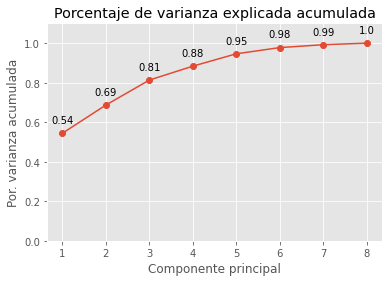

In [83]:
# Porcentaje de varianza explicada acumulada
# ==============================================================================
prop_varianza_acum = modelo_pca.explained_variance_ratio_.cumsum()
print('------------------------------------------')
print('Porcentaje de varianza explicada acumulada')
print('------------------------------------------')
print(prop_varianza_acum)

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(6, 4))
ax.plot(
    np.arange(len(capital_nuevo.columns)) + 1,
    prop_varianza_acum,
    marker = 'o'
)

for x, y in zip(np.arange(len(capital_nuevo.columns)) + 1, prop_varianza_acum):
    label = round(y, 2)
    ax.annotate(
        label,
        (x,y),
        textcoords="offset points",
        xytext=(0,10),
        ha='center'
    )
    
ax.set_ylim(0, 1.1)
ax.set_xticks(np.arange(modelo_pca.n_components_) + 1)
ax.set_title('Porcentaje de varianza explicada acumulada')
ax.set_xlabel('Componente principal')
ax.set_ylabel('Por. varianza acumulada');

In [84]:
# Proyección de las observaciones de entrenamiento
# ==============================================================================
proyecciones = pca_pipe.transform(X=capital_nuevo)
proyecciones = pd.DataFrame(
    proyecciones,
    columns = ['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8'],
    index   = capital_nuevo.index
)
proyecciones.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8
0,-0.808560,0.918472,-0.589450,1.213154,-0.986401,0.402340,-0.034185,-0.169447
1,-1.777296,-0.147590,-0.347912,0.093274,0.183663,0.106516,-0.115425,-0.140570
2,-0.949153,-0.974693,-0.501875,0.584883,0.654107,-0.449777,0.391476,-0.105149
3,-1.524562,-0.318107,-0.013917,0.321387,0.313134,-0.001588,-0.195372,-0.129681
4,-1.254580,0.044286,-0.119769,0.563829,0.494558,0.032319,-0.316938,-0.120723


## K-means

In [85]:
# Tratamiento de datos
# ==============================================================================
import numpy as np
import pandas as pd
from sklearn.datasets import make_blobs

# Gráficos
# ==============================================================================
import matplotlib.pyplot as plt
from matplotlib import style
style.use('ggplot') or plt.style.use('ggplot')

# Preprocesado y modelado
# ==============================================================================
from sklearn.cluster import KMeans
from sklearn.preprocessing import scale
from sklearn.metrics import silhouette_score

# Configuración warnings
# ==============================================================================
import warnings
warnings.filterwarnings('ignore')

In [86]:
# Escalado de datos
# ==============================================================================
X_scaled = scale(X)

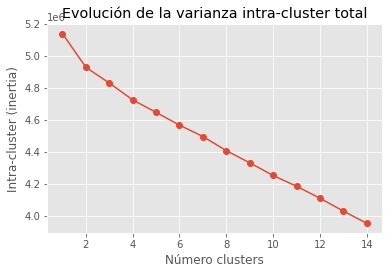

In [87]:
# Método elbow para identificar el número óptimo de clusters
# ==============================================================================
range_n_clusters = range(1, 15)
inertias = []

for n_clusters in range_n_clusters:
    modelo_kmeans = KMeans(
                        n_clusters   = n_clusters, 
                        n_init       = 20, 
                        random_state = 123
                    )
    modelo_kmeans.fit(X_scaled)
    inertias.append(modelo_kmeans.inertia_)

fig, ax = plt.subplots(1, 1, figsize=(6, 3.84))
ax.plot(range_n_clusters, inertias, marker='o')
ax.set_title("Evolución de la varianza intra-cluster total")
ax.set_xlabel('Número clusters')
ax.set_ylabel('Intra-cluster (inertia)');

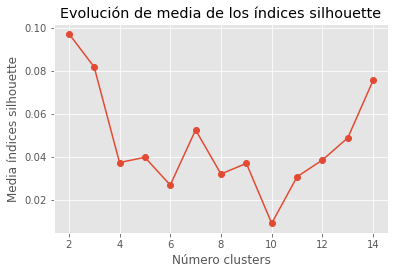

In [88]:
# Método silhouette para identificar el número óptimo de clusters
# ==============================================================================
range_n_clusters = range(2, 15)
valores_medios_silhouette = []

for n_clusters in range_n_clusters:
    modelo_kmeans = KMeans(
                        n_clusters   = n_clusters, 
                        n_init       = 20, 
                        random_state = 123
                    )
    cluster_labels = modelo_kmeans.fit_predict(X_scaled)
    silhouette_avg = silhouette_score(X_scaled, cluster_labels)
    valores_medios_silhouette.append(silhouette_avg)
    
fig, ax = plt.subplots(1, 1, figsize=(6, 3.84))
ax.plot(range_n_clusters, valores_medios_silhouette, marker='o')
ax.set_title("Evolución de media de los índices silhouette")
ax.set_xlabel('Número clusters')
ax.set_ylabel('Media índices silhouette');

In [89]:
# Modelo
# ==============================================================================
X_scaled = scale(X)
modelo_kmeans = KMeans(n_clusters=14, n_init=25, random_state=123)
modelo_kmeans.fit(X=X_scaled)

KMeans(n_clusters=14, n_init=25, random_state=123)

In [90]:
# Clasificación con el modelo kmeans
# ==============================================================================
y_predict = modelo_kmeans.predict(X=X_scaled)

In [91]:
etiquetas_1 = modelo_kmeans.labels_
print(etiquetas_1.shape)

(75617,)


In [92]:
etiquetas = modelo_kmeans.labels_
centros = modelo_kmeans.cluster_centers_

In [93]:
centros_1 = modelo_kmeans.cluster_centers_
print(centros_1)

[[-1.17984807e+00  1.42380474e+00 -3.05336346e-01 -2.70377239e-01
  -4.54959500e-01 -3.18755956e-01 -3.35274362e-01 -3.57574462e-01
  -9.01539311e-02 -6.42600278e-02  1.08950322e-01 -7.22799866e-02
  -4.45827739e-02 -3.09751837e-01 -1.78463253e-01 -9.16594581e-02
  -1.98120663e-01 -2.74652745e-01 -5.87387735e-02 -9.83215393e-02
  -2.76735391e-01 -8.13185525e-03 -7.77187619e-02 -9.22445077e-02
  -8.08435941e-02 -1.30016344e-01 -8.69192922e-02  1.42222187e+01
  -1.66091524e-01 -1.01494590e-01 -8.71506759e-02 -8.79940342e-02
  -8.20773803e-02 -9.59633440e-02 -8.51250861e-02 -1.52563562e-01
  -9.54003200e-02 -4.17367046e-01 -5.13675713e-02 -1.28163314e-01
  -9.39785393e-02 -5.68966914e-02 -7.35629963e-02 -1.11162420e-01
  -4.97907593e-02 -1.12495982e-01 -2.60317609e-01 -9.57525839e-02
  -1.10857211e-01 -1.10551200e-01 -9.46208904e-02 -1.09628291e-01
  -4.53212306e-02 -4.03641989e-02 -5.13675713e-02 -2.88764043e-01
  -1.26716534e-01 -6.54969500e-02 -7.48244750e-02 -7.87454694e-02
  -5.74785

In [94]:
# Tratamiento de datos
# ==============================================================================
import numpy as np
import pandas as pd
from sklearn.datasets import make_blobs

# Gráficos
# ==============================================================================
import matplotlib.pyplot as plt
from matplotlib import style
style.use('ggplot') or plt.style.use('ggplot')

# Preprocesado y modelado
# ==============================================================================
from sklearn.cluster import KMeans
from sklearn.preprocessing import scale
from sklearn.metrics import silhouette_score

# Configuración warnings
# ==============================================================================
import warnings
warnings.filterwarnings('ignore')

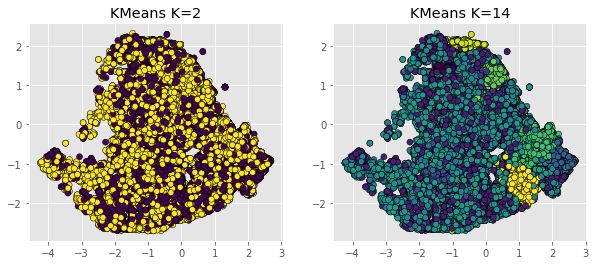

In [95]:
fig, ax = plt.subplots(1, 2, figsize=(10, 4))

# Resultados para K = 2
# ==============================================================================
y_predict = KMeans(n_clusters=2, n_init=25, random_state=123).fit_predict(X=X_scaled)
ax[0].scatter(
        x = X_scaled[:, 0],
        y = X_scaled[:, 1], 
        c = y_predict,
        #cmap='viridis',
        marker    = 'o',
        edgecolor = 'black'
    )
ax[0].set_title('KMeans K=2');

# Resultados para K = 6
# ==============================================================================
y_predict = KMeans(n_clusters=14, n_init=25, random_state=123).fit_predict(X=X_scaled)
ax[1].scatter(
        x = X_scaled[:, 0],
        y = X_scaled[:, 1], 
        c = y_predict,
        #cmap='viridis',
        marker    = 'o',
        edgecolor = 'black'
    )
ax[1].set_title('KMeans K=14'); 


## CONCLUSIONES


El proyecto fue muy eficiente en demostrar la importancia de realizar un correcto preprocesamiento de datos. Como se señala a menudo, quedó claro el lema "garbage in, garbage out", en tanto este proyecto demuestra que una mejora en el preprocesamiento de los datos tiene un impacto enorme en la capacidad predictiva de los modelos que se utilizan. 

En este sentido, facilitando la exploración inicial, la librería pandas profiling ha tenido un fuerte impacto en nuestro trabajo. Al presentar un resumen tan completo de las condiciones del dataset, estamos en condiciones de implementar las técnicas de preprocesamiento inemdiatamente y corroborar el impacto sobre los dataset con esta librería.

En efecto, utilizando los mismos modelos que en el primer proyecto, se paso de una raíz del error cuadrático medio en Test: 228.139.045 para el mejor modelo a un error cuadrático medio en Test de 57.127.31, sin que exista una varianza muy importante entre Train y Test.
En esta iteración, mejorando el preprocesamiento de datos, los mismos modelos mejoraron aún más su capacidad predictiva.El árbol de decisión llevó el error cuadrático medio a 14 mil dólares para el conjunto de evaluación, sin que exista una varianza importante con el de entrenamiento. Esto representa una mejora impresionante en la capacidad predictiva.

En cuanto a los resultados obtenidos, los modelos avanzados consiguen una mejora my significativa respecto a los más simples. El Random Forest, obtuvo mejores resultados, tras optimizar los hiperparámetros, se consigue reducir el error rmse del modelo a 5 mil dólares para el conjunto de evaluación. Esto quiere decir que las predicciones del modelo final se alejan en promedio 5 mil unidades (5 mil dólares) del valor real.Además obtuvo buenos puntajes en la validación cruzada, afirmando que el modelo funciona corerctamente independemiento de la partición que se le realcien a los datos. 

El random forest, además, tiene un costo computacional mucho menor que el otro modelo avanzado elegido, el XGBOOST, que si bien tiene un muy buen desempeño en lo que hace al error cuadrático medio, demora más de dos hora en procesarse.

Las variables independientes más importantes a la hora de predecir el precio de una vivienda fueron la superficie cubierta, el precio por metro cuadrado y la cantidad de baños con los que cuenta.

Finalmente, hemos implementando técnias de reducción de dimensionalidad con PCA y de clustering, utilizando el método K-means, mostrando que el resultado óptimo de los agrupamientos de datos esta entre dos y 14 clusters.
